In [4]:
import os 
from PIL import Image
import cv2
import numpy as np
import os
os.environ["KMP_DUPLICATE_LIB_OK"]="TRUE"
import matplotlib
import matplotlib.pyplot as plt
import imageio

#import tkinter
#matplotlib.use('TkAgg')

from skimage.measure import ransac
from skimage.transform import ProjectiveTransform
from skimage.transform import AffineTransform

##############################################

from pathlib import Path
import random
import matplotlib.cm as cm
import torch

from models.matching import Matching
#from models.utils import (compute_pose_error, compute_epipolar_error,
#                          estimate_pose, make_matching_plot,
#                          error_colormap, AverageTimer, pose_auc, read_image,
#                          rotate_intrinsics, rotate_pose_inplane,
#                          scale_intrinsics)

#from models.utils import read_image

torch.set_grad_enabled(False)




In [5]:
print('hola')

hola


In [6]:
# Parametres

cache=False
eval=False
fast_viz=False
force_cpu=False
input_dir='assets/pair/'
input_pairs='assets/pair.txt'
keypoint_threshold=0.005
match_threshold=0.2
max_keypoints=1024
max_length=-1
nms_radius=4
opencv_display=False
output_dir='resultat'
resize=[640, 480]
resize_float=False
show_keypoints=False
shuffle=False
sinkhorn_iterations=20
superglue='outdoor'
viz=True
viz_extension='jpg'

In [7]:
assert not (opencv_display and not viz), 'Must use --viz with --opencv_display'
assert not (opencv_display and not fast_viz), 'Cannot use --opencv_display without --fast_viz'
assert not (fast_viz and not viz), 'Must use --viz with --fast_viz'
assert not (fast_viz and viz_extension == 'pdf'), 'Cannot use pdf extension with --fast_viz'

if (len(resize) == 2) and (resize[1] == -1):    
    resize = resize[0:1]
if len(resize) == 2:
    print('Will resize to {}x{} (WxH)'.format(
        resize[0], resize[1]))
elif len(resize) == 1 and resize[0] > 0:
    print('Will resize max dimension to {}'.format(resize[0]))
elif len(resize) == 1:
    print('Will not resize images')
else:
    raise ValueError('Cannot specify more than two integers for --resize')

Will resize to 640x480 (WxH)


In [8]:
    with open(input_pairs, 'r') as f:
        pairs = [l.split() for l in f.readlines()]

        print(pairs)

    if max_length > -1:
        pairs = pairs[0:np.min([len(pairs), max_length])]

    if shuffle:
        random.Random(0).shuffle(pairs)
        
    # Load the SuperPoint and SuperGlue models.
    device = 'cuda' if torch.cuda.is_available() and not force_cpu else 'cpu'
    print('Running inference on device \"{}\"'.format(device))
    config = {
        'superpoint': {
            'nms_radius': nms_radius,
            'keypoint_threshold': keypoint_threshold,
            'max_keypoints': max_keypoints
        },
        'superglue': {
            'weights': superglue,
            'sinkhorn_iterations': sinkhorn_iterations,
            'match_threshold': match_threshold,
        }
    }
    
    matching = Matching(config).eval().to(device)
    
    # Create the output directories if they do not exist already.
    input_dir = Path(input_dir)
    print('Looking for data in directory \"{}\"'.format(input_dir))
    output_dir = Path(output_dir)
    output_dir.mkdir(exist_ok=True, parents=True)
    print('Will write matches to directory \"{}\"'.format(output_dir))
    if eval:
        print('Will write evaluation results',
              'to directory \"{}\"'.format(output_dir))
    if viz:
        print('Will write visualization images to',
              'directory \"{}\"'.format(output_dir))
    #timer = AverageTimer(newline=True)  

[['11.jpg', '12.jpg']]
Running inference on device "cpu"
Loaded SuperPoint model
Loaded SuperGlue model ("outdoor" weights)
Looking for data in directory "assets\pair"
Will write matches to directory "resultat"
Will write visualization images to directory "resultat"


In [9]:
def filteringBlackAreaKeypoints(img,keypoints,keypoints1):
    new_keypoints = [[1,1]]
    new_keypoints1 = [[1,1]]
    
#     print('img.shape', img.shape)
    
    #print('keypoints : ',keypoints)

    for i in range(len(keypoints)):
        kpt_x = int(keypoints[i][0])
        kpt_y = int(keypoints[i][1])
        img_kpt = img[(kpt_y-2):(kpt_y+3),(kpt_x-2):(kpt_x+3)]
        
        nbr_zeros=0
        
        for m in range(img_kpt.shape[0]):
            for n in range(img_kpt.shape[1]):
                if(img_kpt[m,n]==0):
                    nbr_zeros += 1
                                
#         sum_masque = np.sum(img_kpt)
#         print('sum : ',sum_masque)
#         if(sum_masque >  2000):
        #print('nbr_zeros :',nbr_zeros)
        if (nbr_zeros<1):
#             plt.figure(figsize=(10, 10))
#             plt.imshow(img_kpt)
#             plt.axis('off')
#             plt.show()
            #print(img_kpt)
            new_keypoints = np.concatenate((new_keypoints,[keypoints[i]]),axis=0)
            new_keypoints1 = np.concatenate((new_keypoints1,[keypoints1[i]]),axis=0)
        
    #print('new_keypoints[1:] : ',new_keypoints[1:])
            
    return new_keypoints[1:],new_keypoints1[1:]

def process_resize(w, h, resize):
    assert(len(resize) > 0 and len(resize) <= 2)
    if len(resize) == 1 and resize[0] > -1:
        scale = resize[0] / max(h, w)
        w_new, h_new = int(round(w*scale)), int(round(h*scale))
    elif len(resize) == 1 and resize[0] == -1:
        w_new, h_new = w, h
    else:  # len(resize) == 2:
        w_new, h_new = resize[0], resize[1]

    # Issue warning if resolution is too small or too large.
    if max(w_new, h_new) < 160:
        print('Warning: input resolution is very small, results may vary')
    elif max(w_new, h_new) > 2000:
        print('Warning: input resolution is very large, results may vary')

    return w_new, h_new

def frame2tensor(frame, device):
    return torch.from_numpy(frame/255.).float()[None, None].to(device)



In [138]:
def crop_image(img,xC,yC,sizeX,sizeY):
    #y,x,z = img.shape
    startx = xC - sizeX//2
    starty = yC - sizeY//2  
    
    img_out = img[starty:(starty+sizeY),startx:(startx+sizeX),:]
    
    while(img_out.shape[0] == 0 or img_out.shape[1]==0):
        sizeX = sizeX - 20        
        sizeY = sizeY - 20
        startx = xC - sizeX//2
        starty = yC - sizeY//2
        img_out = img[starty:(starty+sizeY),startx:(startx+sizeX),:]
    
    return img_out,sizeX1


In [231]:
def read_image(path, device, resize, rotation, resize_float):
    image = cv2.imread(str(path), cv2.IMREAD_GRAYSCALE)
    if image is None:
        return None, None, None
    w, h = image.shape[1], image.shape[0]
    w_new, h_new = process_resize(w, h, resize)
    scales = (float(w) / float(w_new), float(h) / float(h_new))

    if resize_float:
        image = cv2.resize(image.astype('float32'), (w_new, h_new))
    else:
        image = cv2.resize(image, (w_new, h_new)).astype('float32')

    if rotation != 0:
        image = np.rot90(image, k=rotation)
        if rotation % 2:
            scales = scales[::-1]

    inp = frame2tensor(image, device)
    return image, inp, scales

def read_image2(image_int, device, resize, rotation, resize_float):
    image = cv2.cvtColor(image_int, cv2.COLOR_BGR2GRAY)
    if image is None:
        return None, None, None
    w, h = image.shape[1], image.shape[0]
    w_new, h_new = process_resize(w, h, resize)
    scales = (float(w) / float(w_new), float(h) / float(h_new))

    if resize_float:
        image = cv2.resize(image.astype('float32'), (w_new, h_new))
    else:
        image = cv2.resize(image, (w_new, h_new)).astype('float32')

    if rotation != 0:
        image = np.rot90(image, k=rotation)
        if rotation % 2:
            scales = scales[::-1]

    inp = frame2tensor(image, device)
    return image, inp, scales

def get_matrice_transformation(image0_frag,image1_fre,rotation,device,resize,resize_float,do_viz,Tx,Ty,sizeX1):
    image0, inp0 , scales0 = read_image2(
        image0_frag , device, resize, 0, resize_float)
    image1, inp1, scales1 = read_image2(
        image1_fre , device, resize, 0, resize_float)
    
    fact_i_0 = image0_frag.shape[0] / image0.shape[0]
    fact_j_0 = image0_frag.shape[1] / image0.shape[1]
    
    fact_i_1 = image1_fre.shape[0] / image1.shape[0]
    fact_j_1 = image1_fre.shape[1] / image1.shape[1]
    
    
    # Perform the matching.
    pred = matching({'image0': inp0, 'image1': inp1})
    pred = {k: v[0].cpu().numpy() for k, v in pred.items()}
    kpts0, kpts1 = pred['keypoints0'], pred['keypoints1']
    matches, conf = pred['matches0'], pred['matching_scores0']
    
    # Keep the matching keypoints.
    valid = matches > -1
    mkpts0 = kpts0[valid]
    mkpts1 = kpts1[matches[valid]]
    mconf = conf[valid]
    '''
    plt.figure(figsize=(10, 10))
    plt.imshow(image0,cmap='gray')
    plt.plot(mkpts0[:, 0], mkpts0[:, 1], "og", markersize=5)  # og:shorthand for green circle
    plt.axis('off')
    plt.show()
    '''
    mkpts0, mkpts1 = filteringBlackAreaKeypoints(image0,mkpts0,mkpts1)
    
    nbr_matches = len( mkpts0)
    
    
    
    if ( len(mkpts0) < 3  ):
        #print('Error : not enough matches, {} matches'.format(len(mkpts0)))
        return -1,0,0, False

    

    #print(mkpts0.shape)
    #print(len(mkpts0))
        
    
    mkpts0[:, 1] *= fact_i_0
    mkpts0[:, 0] *= fact_j_0
    
    mkpts1[:, 1] *= fact_i_1
    mkpts1[:, 0] *= fact_j_1
    '''
    plt.figure(figsize=(10, 10))
    plt.imshow(image0_frag,cmap='gray')
    plt.plot(mkpts0[:, 0], mkpts0[:, 1], "og", markersize=5)  # og:shorthand for green circle
    plt.axis('off')
    plt.show()   
    
    plt.figure(figsize=(10, 10))
    plt.imshow(image1_fre,cmap='gray')
    plt.plot(mkpts1[:, 0], mkpts1[:, 1], "og", markersize=5)  # og:shorthand for green circle
    plt.axis('off')
    plt.show()
    '''
    
    L_y, L_x , L_z  = image0_frag2.shape
    
    startx = Tx - sizeX1//2 
    starty = Ty - sizeY1//2
    
    #print(starty,startx)
    #print(image_original.shape)
    
    mkpts1[:, 0] += startx
    mkpts1[:, 1] += starty
    
    '''
    plt.figure(figsize=(10, 10))
    plt.imshow(image_original[(int(mkpts1[1, 0]-n)):(int(mkpts1[1, 0]+n+1)),(int(mkpts1[1, 1])-n):(int(mkpts1[1, 1])+n+1)])
    plt.axis('off')
    plt.show() 
    '''
    
    
    #print(mkpts0)
    
    copy_mkpts0 = np.copy(mkpts0)
    if (rotation == 90):
        #image0_frag_rot = np.rot90(image0_frag)
        #print(copy_mkpts0)
        mkpts0[:, 0] = L_x - copy_mkpts0[:, 1]
        mkpts0[:, 1] = copy_mkpts0[:, 0] 
    elif (rotation == 180):
        #print(copy_mkpts0)
        #image0_frag_rot = np.rot90(image0_frag)
        #image0_frag_rot = np.rot90(image0_frag_rot)
        mkpts0[:, 0] = L_x - copy_mkpts0[:, 0]
        mkpts0[:, 1] = L_y - copy_mkpts0[:, 1] 
    elif (rotation == 270):
        #image0_frag_rot = np.rot90(image0_frag)
        #image0_frag_rot = np.rot90(image0_frag_rot)
        #image0_frag_rot = np.rot90(image0_frag_rot)
        #print(copy_mkpts0)
        mkpts0[:, 0] = copy_mkpts0[:, 1]
        mkpts0[:, 1] = L_y - copy_mkpts0[:, 0] 
    
    #print(image_original[int(mkpts1[0, 1]),int(mkpts1[0, 0]),:])
    #print(np.where(image_original[(int(mkpts1[1, 0]-5)):(int(mkpts1[1, 0]+6)),(int(mkpts1[1, 1])-5):(int(mkpts1[1, 1])+6)] == a))
    '''
    plt.figure(figsize=(30, 30))
    plt.imshow(image_original)
    plt.plot(mkpts1[:, 0], mkpts1[:, 1], "og", markersize=1)  # og:shorthand for green circle
    plt.axis('off')
    plt.show()  
    '''
    np.random.seed(0)
    
    #model1, inliers = ransac(
    #    (mkpts0, mkpts1),
    #    ProjectiveTransform, min_samples=4,
    #    residual_threshold=4, max_trials=10000
    #)
    
    #print('model1',model1)
    
    #print('inliers',inliers)
    
    
    transformation_matrix, rigid_mask = cv2.estimateAffinePartial2D(mkpts0, mkpts1)
    
    inliers = np.transpose(rigid_mask[:] ==1 )[0]
    
    #print('transformation_rigid_matrix',transformation_rigid_matrix)
    #print(transformation_rigid_matrix[1,2])
    
    #print('rigid_mask',np.transpose(rigid_mask[:] ==1 )[0])
    
    n_inliers = np.sum(inliers)
    #print('Nbr Matches apres filtrage :',len( mkpts0))
    #print('Number of inliers: %d.' % n_inliers)
    
    if ( n_inliers < 3  ):
        #print('Error : not enough matches, {} matches'.format(len(mkpts0)))
        return -1,0,0, False
    
    if do_viz:
        n_inliers = np.sum(inliers)
        print('Number of inliers: %d.' % n_inliers)
        inlier_keypoints_left = [cv2.KeyPoint(point[0], point[1], 1) for point in mkpts0[inliers]]
        inlier_keypoints_right = [cv2.KeyPoint(point[0], point[1], 1) for point in mkpts1[inliers]]
        placeholder_matches = [cv2.DMatch(idx, idx, 5) for idx in range(n_inliers)]


        image_r1 = cv2.drawMatches(image0_frag, inlier_keypoints_left, image_original, inlier_keypoints_right, placeholder_matches, None)
        
        plt.figure(figsize=(10, 10))
        plt.imshow(image_r1)
        plt.axis('off')
        plt.show()

    #print(transformation_matrix)
    '''
    T_x = transformation_matrix[0,2]
    T_y = transformation_matrix[1,2]
    rot = - np.angle(transformation_matrix[0,0]+transformation_matrix[1,0]*1j)*180/np.pi
    
    if rot > 0 :
        rot=rot-360
    

    
    tx = -T_y + L_x*np.sin(rot*np.pi/180)/2 - L_y*np.cos(rot*np.pi/180)/2
    ty = -T_x - L_x*np.cos(rot*np.pi/180)/2 - L_y*np.sin(rot*np.pi/180)/2
    '''
    #print('Transltation : (',T_x,',', T_y,')')
    #print('Rotation : ', rot)
    
    bool_accompli = True
    
    return transformation_matrix, nbr_matches , n_inliers, bool_accompli
    
    

def get_matrice_transformationCorrect(image0_frag,image1_fre,device,resize,resize_float,do_viz,Tx,Ty,sizeX1):
    
    rotation = 0    
    transformation_matrix_0, nbr_matches_0 , nbr_inliers_0,bool_accompli_0 = get_matrice_transformation(image0_frag,image1_fre,rotation,device,resize,resize_float,do_viz,Tx,Ty,sizeX1)
    #print('Transltation : (',T_x_0,',', T_y_0,')')
    #print('Rotation : ', rot_0)
    
    
    #print('######################## ROTATION : 90 ################')    
    image0_frag = np.rot90(image0_frag)
    rotation = 90
    transformation_matrix_90, nbr_matches_90 , nbr_inliers_90,bool_accompli_90 = get_matrice_transformation(image0_frag,image1_fre,rotation,device,resize,resize_float,do_viz,Tx,Ty,sizeX1)   
    #print('Transltation : (',T_x_90,',', T_y_90,')')
    #print('Rotation : ', rot_90)
    
    
    #print('################ ROTATION : 180 ################')
    image0_frag = np.rot90(image0_frag)
    rotation = 180
    transformation_matrix_180, nbr_matches_180 , nbr_inliers_180,bool_accompli_180 = get_matrice_transformation(image0_frag,image1_fre,rotation,device,resize,resize_float,do_viz,Tx,Ty,sizeX1)    
    #print('Transltation : (',T_x_180,',', T_y_180,')')
    #print('Rotation : ', rot_180)
    
    
    #print('################ ROTATION : 270 ####################')
    image0_frag = np.rot90(image0_frag)
    rotation = 270
    transformation_matrix_270, nbr_matches_270 , nbr_inliers_270,bool_accompli_270 = get_matrice_transformation(image0_frag,image1_fre,rotation,device,resize,resize_float,do_viz,Tx,Ty,sizeX1)    
    #print('Transltation : (',T_x_270,',', T_y_270,')')
    #print('Rotation : ', rot_270)
    
    #rotations = np.array([rot_0,rot_90,rot_180,rot_270])
    #T_x_t = np.array([T_x_0,T_x_90,T_x_180,T_x_270])
    #T_y_t = np.array([T_y_0,T_y_90,T_y_180,T_y_270])
    nbr_matches_t = np.array([nbr_matches_0,nbr_matches_90,nbr_matches_180,nbr_matches_270])
    nbr_inliers_t = np.array([nbr_inliers_0,nbr_inliers_90,nbr_inliers_180,nbr_inliers_270])
    
    #print(rotations)
    #print(T_x_t)
    #print(T_y_t)
    #print(nbr_matches_t)
    #print(nbr_inliers_t)
    
    index_resultat =-1
    
    if(bool_accompli_0 == False and bool_accompli_90 == False and bool_accompli_180 == False and bool_accompli_270 == False ):
        print('Error: Pas possible de trouver Matrice de rotation')
        return 'Nan','Nan','Nan'
    else:
        nbr_inliers_max = np.max(nbr_inliers_t)
        nbr_inliers_max_index = np.where(nbr_inliers_t == nbr_inliers_max)
        #print('len(nbr_inliers_max_index[0])',len(nbr_inliers_max_index[0]))
        
        if(len(nbr_inliers_max_index[0]) > 1 ):
            nbr_matches_t[np.where(nbr_inliers_t != nbr_inliers_max)[0]] = 0
            #print('nbr_matches_t',nbr_matches_t)
            nbr_matches_max = np.max(nbr_matches_t)
            #print('nbr_matches_max',nbr_matches_max)
            nbr_matches_max_index = np.where(nbr_matches_t == nbr_matches_max)
            #print('nbr_matches_max_index',nbr_matches_max_index)            
            index_resultat = nbr_matches_max_index[0][0] 
            #print('nbr_matches_max_index',nbr_matches_max_index)
        else:
            index_resultat = nbr_inliers_max_index[0][0]
            
    #Tx = T_x_t[index_resultat]
    #Ty = T_y_t[index_resultat]
    #rot = rotations[index_resultat]
    if(index_resultat == 0):
        matrice_correct = transformation_matrix_0
    elif(index_resultat == 1):
        matrice_correct = transformation_matrix_90
    elif(index_resultat == 2):
        matrice_correct = transformation_matrix_180
    elif(index_resultat == 3):
        matrice_correct = transformation_matrix_270
        
    print(matrice_correct)
    
    T_x = matrice_correct[0,2]
    T_y = matrice_correct[1,2]
    rot = - np.angle(matrice_correct[0,0]+matrice_correct[1,0]*1j)*180/np.pi
    
    if rot > 0 :
        rot=rot-360
    

    
    tx = -T_y + L_x*np.sin(rot*np.pi/180)/2 - L_y*np.cos(rot*np.pi/180)/2
    ty = -T_x - L_x*np.cos(rot*np.pi/180)/2 - L_y*np.sin(rot*np.pi/180)/2
    
    
    return tx, ty, rot
    


In [235]:
# Process the file
path_images = r"C:\\projects\\SuperGluePretrainedNetwork\\Leonardo-da-Vinci_Ultima-Cena_5193x2926_2019-2-28_13.56.32\\frag_eroded"
path_image_list_file = "C:\\projects\\SuperGluePretrainedNetwork\\Leonardo-da-Vinci_Ultima-Cena_5193x2926_2019-2-28_13.56.32\\fragments2.txt"
fichier = open(path_image_list_file, "r")
text = fichier.read()
data = text.split('\n')
path_imageOriginal = r"C:\\projects\\SuperGluePretrainedNetwork\\Leonardo-da-Vinci_Ultima-Cena_5193x2926_2019-2-28_13.56.32\\Leonardo-da-Vinci_Ultima-Cena_5193x2926.ppm"  
image_original = np.array(Image.open(path_imageOriginal))

# Handle --cache logic.
do_viz = False

for i in range(len(data)-1):
    Tx_hat='Nan'
    Ty_hat='Nan'
    rot_hat='Nan'
    id_fragment = int(data[i].split(' ')[0])
    Tx = int(data[i].split(' ')[1])
    Ty = int(data[i].split(' ')[2])
    rot = int(data[i].split(' ')[2])
    
    path = os.path.join(path_images,'frag_eroded_{}_color.ppm'.format(id_fragment))
    image0_frag = np.array(Image.open(path))
    sizeX1 = sizeY1 = int(np.mean(image0_frag.shape[0:2]))
    
    image1_fre, sizeX1 = crop_image(image_original,Tx,Ty,sizeX1,sizeY1)    
    
    
    print('MATRICE TRANSFORMATION DU FRAGMENT {} :'.format(id_fragment))
    
    Tx_hat, Ty_hat, rot_hat = get_matrice_transformationCorrect(image0_frag,image1_fre,device,resize,resize_float,do_viz,Tx,Ty,sizeX1)   
    if (Tx_hat != 'Nan' and Ty_hat != 'Nan'and rot_hat != 'Nan'):
        print('Translation : (',Tx_hat,',', Ty_hat,')')
        print('Rotation : ', rot_hat)
        
    

MATRICE TRANSFORMATION DU FRAGMENT 97 :
[[-1.39044314e-01 -9.89282472e-01  2.61523237e+03]
 [ 9.89282472e-01 -1.39044314e-01  2.48542891e+03]]
Translation : ( -2635.6452450119878 , -2415.8845561754747 )
Rotation :  -98.00055257341043
MATRICE TRANSFORMATION DU FRAGMENT 99 :
Error: Pas possible de trouver Matrice de rotation
MATRICE TRANSFORMATION DU FRAGMENT 111 :
[[ 4.47726832e-01 -8.97906895e-01  4.74136070e+02]
 [ 8.97906895e-01  4.47726832e-01  2.74173131e+02]]
Translation : ( -510.8862773667506 , -394.9439858528891 )
Rotation :  -63.49759967842172
MATRICE TRANSFORMATION DU FRAGMENT 114 :
[[-5.13467120e-01  8.61542194e-01  2.47640791e+03]
 [-8.61542194e-01 -5.13467120e-01  2.27150231e+02]]
Translation : ( 14.825719001503487 , -2537.6626204833788 )
Rotation :  -239.20564810602872


In [177]:
a = np.array([[ 9.97878853e-01 ,-6.83269172e-02 , 1.18467258e+02],[ 6.83269172e-02,  9.97878853e-01,  2.03553990e+03]])
print(a)

tx = -Ty_hat + 353*np.sin(rot_hat*np.pi/180)/2 - 353*np.cos(rot_hat*np.pi/180)/2
ty = -Tx_hat - 353*np.cos(rot_hat*np.pi/180)/2 - 353*np.sin(rot_hat*np.pi/180)/2

print(tx,ty)

[[ 9.97878853e-01 -6.83269172e-02  1.18467258e+02]
 [ 6.83269172e-02  9.97878853e-01  2.03553990e+03]]
-2223.684694395339 -282.49784806083636


In [141]:
sizeX1 = sizeY1 = 355
image1_fre, sizeX1  = crop_image(image_original,Tx,Ty,sizeX1,sizeY1)

if(image1_fre.shape[0] == 0 or image1_fre.shape[1]==0):
    print('hola')

    
#print(image1_fre)
print(image1_fre.shape)

(235, 235, 3)


In [ ]:

    
a = np.array([2,19,4,190,19])
b = np.array([10,20,10,20,200])
c = np.array([1,2,3,4,15])
a_max = np.max(a)
a_max_index = np.where(a == a_max)

index = -1

if(len(a_max_index[0]) > 1 ):
    b[np.where(a != a_max)[0]] = 0
    b_max = np.max(b)
    b_max_index = np.where(b == b_max)
    index = b_max_index[0][0]
    '''
    if(len(b_max_index[0]) > 1 ):
        resultat = c[b_max_index[0]][0]
        index = b_max_index[0][0]
    else:
        resultat = c[b_max_index][0]
        index = b_max_index[0][0]
    '''
else:
    resultat = c[a_max_index][0]
    index = a_max_index[0][0]

    
resultat2 = c[index]

print(c[a_max_index] )
print(a_max)
print(a_max_index)
print(len(b_max_index[0]))
print(a_max_index[0])
print(index)
print('resultat : ', resultat)

print('resultat2 : ', resultat2)

hola
<class 'numpy.ndarray'>


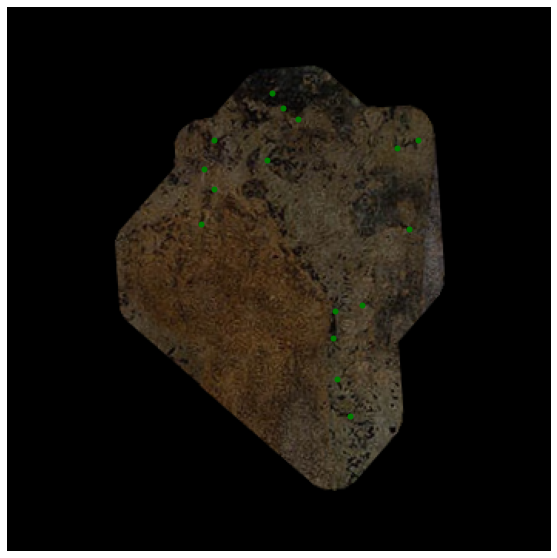

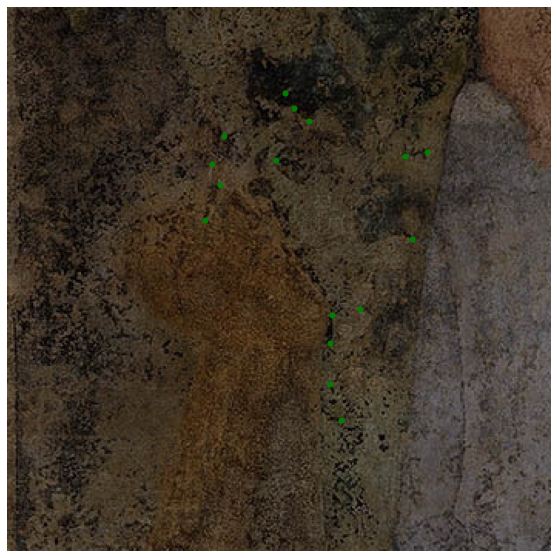

2047 106
(2926, 5193, 3)


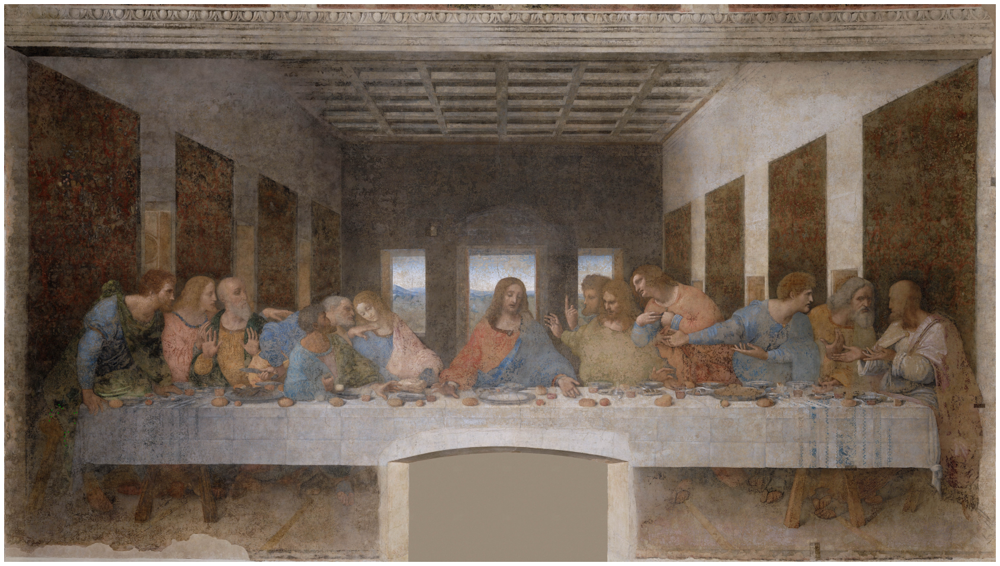

[[171.5359375   55.15625   ]
 [178.70625     64.71666667]
 [188.634375    72.07083333]
 [133.478125    86.04375   ]
 [266.4046875   86.04375   ]
 [252.615625    91.19166667]
 [168.2265625   98.54583333]
 [127.4109375  104.42916667]
 [133.478125   117.66666667]
 [125.2046875  140.46458333]
 [260.3375     143.40625   ]
 [230.0015625  192.67916667]
 [212.3515625  197.09166667]
 [211.2484375  214.00625   ]
 [213.4546875  241.21666667]
 [222.2796875  264.75      ]]
Error : Pas de rotation


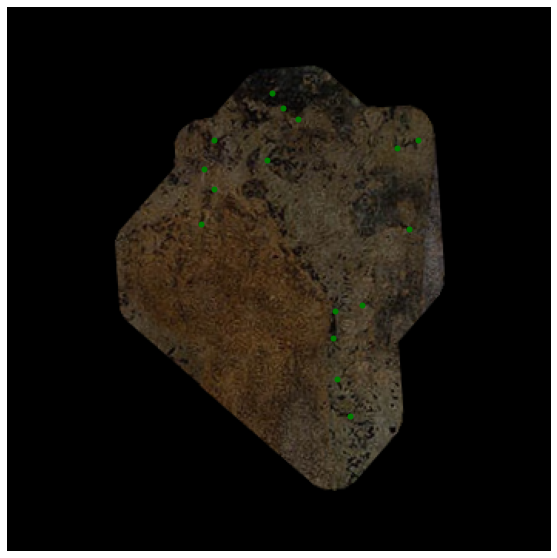

mkpts1.shqpe (16, 2)
Number of inliers: 16.
[[ 9.97878853e-01 -6.83269172e-02  1.18467258e+02]
 [ 6.83269172e-02  9.97878853e-01  2.03553990e+03]]
Transltation : ( 118.46725755819722 , 2035.5398954256216 )
Rotation :  -356.0829483855599
fragment shape (353, 353, 3)


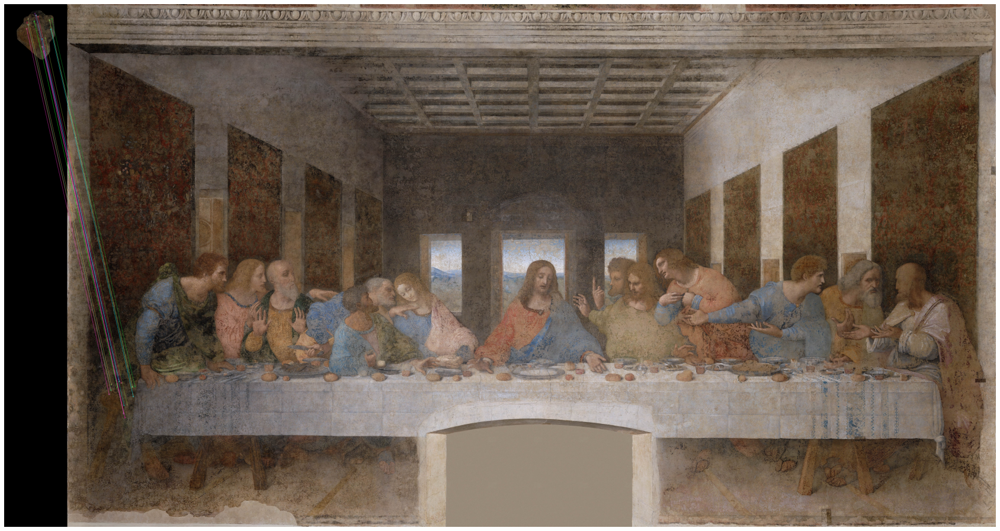

"   \nplt.figure(figsize=(10, 10))\nplt.imshow(image1)\nplt.axis('off')\nplt.show()\n\nprint(image0_frag.shape)\nprint(image1_fre.shape)\nprint(image0.shape)\nprint(image1.shape)\n"

In [23]:
# Process the file
path_images = r"C:\\projects\\SuperGluePretrainedNetwork\\Leonardo-da-Vinci_Ultima-Cena_5193x2926_2019-2-28_13.56.32\\frag_eroded"
path_image_list_file = "C:\\projects\\SuperGluePretrainedNetwork\\Leonardo-da-Vinci_Ultima-Cena_5193x2926_2019-2-28_13.56.32\\fragments2.txt"
fichier = open(path_image_list_file, "r")
text = fichier.read()
data = text.split('\n')

path_imageOriginal = r"C:\\projects\\SuperGluePretrainedNetwork\\Leonardo-da-Vinci_Ultima-Cena_5193x2926_2019-2-28_13.56.32\\Leonardo-da-Vinci_Ultima-Cena_5193x2926.ppm"  
image_original = np.array(Image.open(path_imageOriginal))

# Handle --cache logic.
do_match = True
do_eval = eval
do_viz = viz
do_viz_eval = eval and viz

for i in range(len(data)-1):
    
    print('hola')
    
    id_fragment = int(data[i].split(' ')[0])
    Tx = int(data[i].split(' ')[1])
    Ty = int(data[i].split(' ')[2])
    
    path = os.path.join(path_images,'frag_eroded_{}_color.ppm'.format(id_fragment))
    image0_frag = np.array(Image.open(path))
    
    image0_frag2 = image0_frag
    #image0_frag = np.rot90(image0_frag)    
    #image0_frag = np.rot90(image0_frag)  
    #image0_frag = np.rot90(image0_frag)
    sizeX1 = sizeY1 = int(np.mean(image0_frag.shape[0:2]))
    
    
    image1_fre = crop_image(image_original,Tx,Ty,sizeX1,sizeY1)
    
    image0, inp0 , scales0 = read_image2(
        image0_frag , device, resize, 0, resize_float)
    image1, inp1, scales1 = read_image2(
        image1_fre , device, resize, 0, resize_float)
    
    fact_i_0 = image0_frag.shape[0] / image0.shape[0]
    fact_j_0 = image0_frag.shape[1] / image0.shape[1]
    
    fact_i_1 = image1_fre.shape[0] / image1.shape[0]
    fact_j_1 = image1_fre.shape[1] / image1.shape[1]
    
    if do_match:
        # Perform the matching.
        pred = matching({'image0': inp0, 'image1': inp1})
        pred = {k: v[0].cpu().numpy() for k, v in pred.items()}
        kpts0, kpts1 = pred['keypoints0'], pred['keypoints1']
        matches, conf = pred['matches0'], pred['matching_scores0']
        #timer.update('matcher')

        # Write the matches to disk.
        #out_matches = {'keypoints0': kpts0, 'keypoints1': kpts1,
        #               'matches': matches, 'match_confidence': conf}
        #np.savez(str(matches_path), **out_matches)
    '''
    plt.figure(figsize=(10, 10))
    plt.imshow(image1,cmap='gray')
    plt.plot(kpts1[:, 0], kpts1[:, 1], "og", markersize=5)  # og:shorthand for green circle
    plt.axis('off')
    plt.show()
    
    plt.figure(figsize=(10, 10))
    plt.imshow(image0,cmap='gray')
    plt.plot(kpts0[:, 0], kpts0[:, 1], "og", markersize=5)  # og:shorthand for green circle
    plt.axis('off')
    plt.show()     
        
    kpts0[:, 1] *= fact_i_0
    kpts0[:, 0] *= fact_j_0
    
    kpts1[:, 1] *= fact_i_1
    kpts1[:, 0] *= fact_j_1
    
    plt.figure(figsize=(10, 10))
    plt.imshow(image1_fre,cmap='gray')
    plt.plot(kpts1[:, 0], kpts1[:, 1], "og", markersize=5)  # og:shorthand for green circle
    plt.axis('off')
    plt.show()
    
    plt.figure(figsize=(10, 10))
    plt.imshow(image0_frag,cmap='gray')
    plt.plot(kpts0[:, 0], kpts0[:, 1], "og", markersize=5)  # og:shorthand for green circle
    plt.axis('off')
    plt.show()
    '''



    # Keep the matching keypoints.
    valid = matches > -1
    mkpts0 = kpts0[valid]
    mkpts1 = kpts1[matches[valid]]
    mconf = conf[valid]
    '''
    plt.figure(figsize=(10, 10))
    plt.imshow(image0,cmap='gray')
    plt.plot(mkpts0[:, 0], mkpts0[:, 1], "og", markersize=5)  # og:shorthand for green circle
    plt.axis('off')
    plt.show()
    '''
    
    print(type(mkpts0))
    
    #print('print(mkpts0.shape)',mkpts0.shape)
    mkpts0, mkpts1 = filteringBlackAreaKeypoints(image0,mkpts0,mkpts1)
    #print(mkpts0)
    #print('print(mkpts0.shape)',mkpts0.shape)
    
    mkpts0[:, 1] *= fact_i_0
    mkpts0[:, 0] *= fact_j_0
    
    mkpts1[:, 1] *= fact_i_1
    mkpts1[:, 0] *= fact_j_1
    
    plt.figure(figsize=(10, 10))
    plt.imshow(image0_frag,cmap='gray')
    plt.plot(mkpts0[:, 0], mkpts0[:, 1], "og", markersize=5)  # og:shorthand for green circle
    plt.axis('off')
    plt.show()
    
    plt.figure(figsize=(10, 10))
    plt.imshow(image1_fre)
    plt.plot(mkpts1[:, 0], mkpts1[:, 1], "og", markersize=5)  # og:shorthand for green circle
    plt.axis('off')
    plt.show()
    
    #print(mkpts1.shape)
    #print(image1_fre.shape)
    #print(image1_fre[int(mkpts1[0, 1]),int(mkpts1[0, 0]),:])
    
    
    '''
    a = image1_fre[int(mkpts1[1, 0]),int(mkpts1[1, 1])]
    
    n = 50
    
    plt.figure(figsize=(10, 10))
    plt.imshow(image1_fre[(int(mkpts1[1, 0]-n)):(int(mkpts1[1, 0]+n+1)),(int(mkpts1[1, 1])-n):(int(mkpts1[1, 1])+n+1)])
    plt.axis('off')
    plt.show()  
    '''
    
    #################################################""
    
    startx = Tx - sizeX1//2
    starty = Ty - sizeY1//2
    
    print(starty,startx)
    print(image_original.shape)
    
    mkpts1[:, 0] += startx
    mkpts1[:, 1] += starty
    
    '''
    plt.figure(figsize=(10, 10))
    plt.imshow(image_original[(int(mkpts1[1, 0]-n)):(int(mkpts1[1, 0]+n+1)),(int(mkpts1[1, 1])-n):(int(mkpts1[1, 1])+n+1)])
    plt.axis('off')
    plt.show() 
    '''
    
    #print(image_original[int(mkpts1[0, 1]),int(mkpts1[0, 0]),:])
    #print(np.where(image_original[(int(mkpts1[1, 0]-5)):(int(mkpts1[1, 0]+6)),(int(mkpts1[1, 1])-5):(int(mkpts1[1, 1])+6)] == a))
    
    plt.figure(figsize=(30, 30))
    plt.imshow(image_original)
    plt.plot(mkpts1[:, 0], mkpts1[:, 1], "og", markersize=1)  # og:shorthand for green circle
    plt.axis('off')
    plt.show()
    
    
    
    #################################################""
    
    #################################################""
    print(mkpts0)
    L_y, L_x , L_z  = image0_frag2.shape
    rotation = 0
    copy_mkpts0 = np.copy(mkpts0)
    if (rotation == 90):
        #print(copy_mkpts0)
        mkpts0[:, 0] = L_x - copy_mkpts0[:, 1]
        mkpts0[:, 1] = copy_mkpts0[:, 0] 
    elif (rotation == 180):
        #print(copy_mkpts0)
        mkpts0[:, 0] = L_x - copy_mkpts0[:, 0]
        mkpts0[:, 1] = L_y - copy_mkpts0[:, 1] 
    elif (rotation == 270):
        #print(copy_mkpts0)
        mkpts0[:, 0] = copy_mkpts0[:, 1]
        mkpts0[:, 1] = L_y - copy_mkpts0[:, 0] 
    else :
        print('Error : Pas de rotation')
        
            
        
    #print(copy_mkpts0)
    
    
    
    
    #################################################""
    
    plt.figure(figsize=(10, 10))
    plt.imshow(image0_frag2)
    plt.plot(mkpts0[:, 0], mkpts0[:, 1], "og", markersize=5)  # og:shorthand for green circle
    plt.axis('off')
    plt.show()  
    
    print('mkpts1.shqpe',mkpts1.shape)    
    
    
    transformation_matrix, rigid_mask = cv2.estimateAffinePartial2D(mkpts0, mkpts1)    
    inliers = np.transpose(rigid_mask[:] ==1 )[0]
    ''' 
    model1, inliers = ransac(
        (mkpts0, mkpts1),
        AffineTransform, min_samples=3,
        residual_threshold=4, max_trials=10000)
    transformation_matrix=model1.params
    ''' 
    
    n_inliers = np.sum(inliers)
    print('Number of inliers: %d.' % n_inliers)
    inlier_keypoints_left = [cv2.KeyPoint(point[0], point[1], 1) for point in mkpts0[inliers]]
    inlier_keypoints_right = [cv2.KeyPoint(point[0], point[1], 1) for point in mkpts1[inliers]]
    placeholder_matches = [cv2.DMatch(idx, idx, 1) for idx in range(n_inliers)]
    
    '''    
    print(type(image0))
    print(image0.shape)
    
    image0 = imageio.core.util.Array(image0)
    image1 = imageio.core.util.Array(image1)
    print(type(image0))
    print(image0.shape)
    '''
    image_r1 = cv2.drawMatches(image0_frag, inlier_keypoints_left, image_original, inlier_keypoints_right, placeholder_matches, None)
    #image_r1 = cv2.drawMatches(image0_frag, inlier_keypoints_left, image1_fre, inlier_keypoints_right, placeholder_matches, None)
        
    print(transformation_matrix)
    T_x = transformation_matrix[0,2]
    T_y = transformation_matrix[1,2]
    rot = np.angle(transformation_matrix[0,0]+transformation_matrix[1,0]*1j)*180/np.pi
    
    if rot > 0 :
        rot=rot-360
    
    
    

    print('Transltation : (',T_x,',', T_y,')')
    '''
    
    T_x = transformation_matrix[0,2]*transformation_matrix[0,0]+transformation_matrix[1,2]*transformation_matrix[1,0]
    T_y = transformation_matrix[1,2]*transformation_matrix[0,0]-transformation_matrix[0,2]*transformation_matrix[1,0]
    
    print('Transltation : (',T_x,',', T_y,')')
    '''
    print('Rotation : ', rot)
    
    print('fragment shape',image0_frag.shape)
    
    
    
    
    
    
    
    
    
    
    
    
    
    
    #image1 = Image.fromarray(image_partie_fresque)      
    # image1.save(os.path.join(path_images,'frag_eroded_{}_color_fresque.jpg'.format(id_fragment)))
    # path1 = os.path.join(path_images,'frag_eroded_{}_color_fresque.jpg'.format(id_fragment))
    # image1 = imageio.imread(os.path.join(path_images,'frag_eroded_{}_color_fresque.jpg'.format(id_fragment)))
    


plt.figure(figsize=(30, 30))
plt.imshow(image_r1)
plt.axis('off')
plt.show()

'''   
plt.figure(figsize=(10, 10))
plt.imshow(image1)
plt.axis('off')
plt.show()

print(image0_frag.shape)
print(image1_fre.shape)
print(image0.shape)
print(image1.shape)
''' 
    

In [216]:
print(mkpts0)
print(mkpts1)

[[171.5359375   55.15625   ]
 [178.70625     64.71666667]
 [188.634375    72.07083333]
 [133.478125    86.04375   ]
 [266.4046875   86.04375   ]
 [252.615625    91.19166667]
 [168.2265625   98.54583333]
 [127.4109375  104.42916667]
 [133.478125   117.66666667]
 [125.2046875  140.46458333]
 [260.3375     143.40625   ]
 [230.0015625  192.67916667]
 [212.3515625  197.09166667]
 [211.2484375  214.00625   ]
 [213.4546875  241.21666667]
 [222.2796875  264.75      ]]
[[ 285.809375   2102.15625   ]
 [ 291.8765625  2111.71666667]
 [ 301.8046875  2120.54166667]
 [ 246.096875   2130.10208333]
 [ 377.9203125  2140.39791667]
 [ 364.13125    2143.33958333]
 [ 279.7421875  2145.54583333]
 [ 238.375      2148.4875    ]
 [ 243.890625   2161.725     ]
 [ 233.9625     2184.52291667]
 [ 368.54375    2197.025     ]
 [ 334.8984375  2242.62083333]
 [ 316.696875   2246.29791667]
 [ 315.0421875  2264.68333333]
 [ 315.0421875  2291.15833333]
 [ 322.2125     2314.69166667]]


In [161]:
print(image0_frag.shape)

(347, 347, 3)


In [144]:
a,b,- = image_original.shape
print(a,b,)

SyntaxError: invalid syntax (Temp/ipykernel_3440/1580807325.py, line 1)

0.0


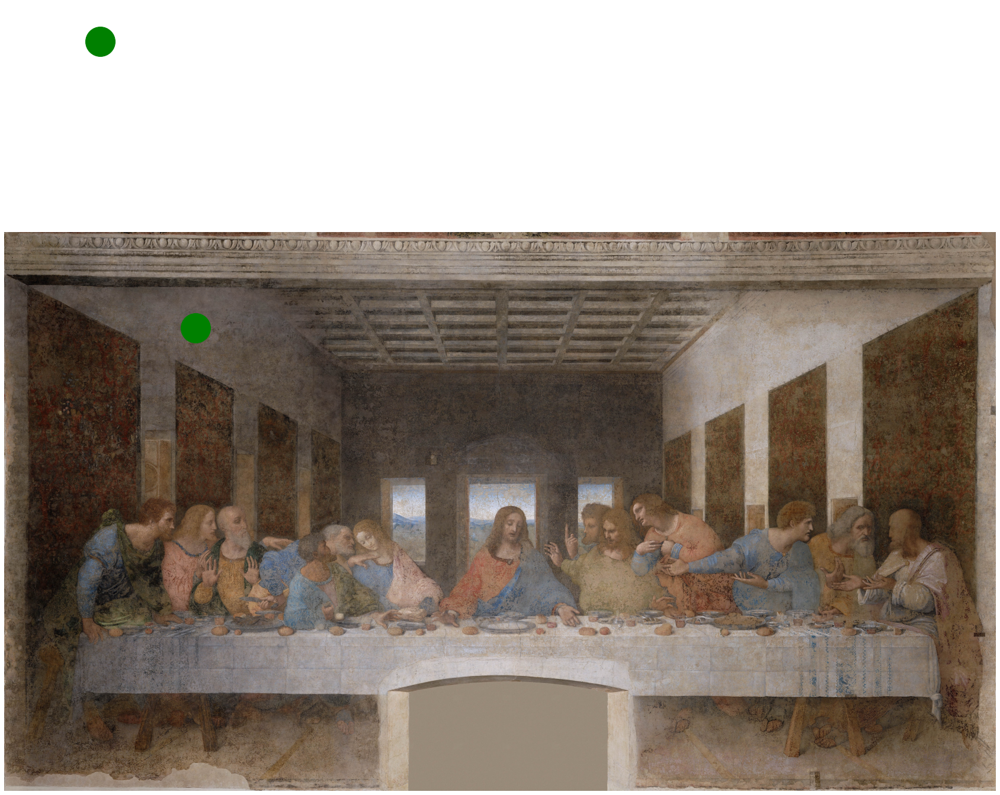

In [105]:
theta = -np.pi/2
x=1000
y=500
x_rot = x*np.cos(theta)-y*np.sin(theta)
y_rot = x*np.sin(theta)+y*np.cos(theta)

print(x**2+y**2-x_rot**2-y_rot**2)

plt.figure(figsize=(30, 30))
plt.imshow(image_original)
#plt.plot(mkpts1[:, 1], mkpts1[:, 0], "og", markersize=1)  # og:shorthand for green circle
plt.plot(x, y, "og", markersize=50)  # og:shorthand for green circle
plt.plot(x_rot, y_rot, "og", markersize=50)  # og:shorthand for green circle
#plt.plot(x, y, "og", markersize=50)  # og:shorthand for green circle
plt.axis('off')
plt.show() 

1623 1546 417
hola


TypeError: unsupported operand type(s) for /: 'str' and 'str'